In [1]:
#!unzip 'drive/MyDrive/Dog Detection Data/dog-breed-identification.zip' -d 'drive/MyDrive/Dog Detection Data/'

# 🐶 End-to-end Multi-Class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow.

## 1. Problem
Identifying the breed of a dog given an image of a dog. 

## 2. Data
The data we're using is from Kaggle dog breed identification competition.

## 3. Evaluation
The evaluation is a file with prediction probabilities fro each dog breed of each test image.

## 4. Features
Some information about data:
* We're with images (unstructured data) so er're are going to use deep learning/transfer learning.
* There are 120 breed of dogs.
* There are around of 10K images in the training set and about the same in test set as well.

### Get our workspace ready
* Import TendorFlow 2.x ✅
* Import TensorFlow Hub
* Make sure we're using GPU

In [2]:
# Import necessary tools
import tensorflow as tf
print('TF version:', tf.__version__)
import tensorflow_hub as hub
print('Hub version:', tf.__version__)

# Check GPU availability
print('GPU:', 'Ready' if tf.config.list_physical_devices('GPU') else 'No GPU available' )

TF version: 2.8.2
Hub version: 2.8.2
GPU: Ready


### Getting data ready (turning into Tensors)
* ML models data has to be in numerical format, so we need to tranform them into Tensors (np.arrays, matrixs, etc).

In [3]:
# Check the labels of our data
import pandas as pd

labels_csv = pd.read_csv('drive/MyDrive/Datasets/Dog Detection Data/labels.csv')

In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [5]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


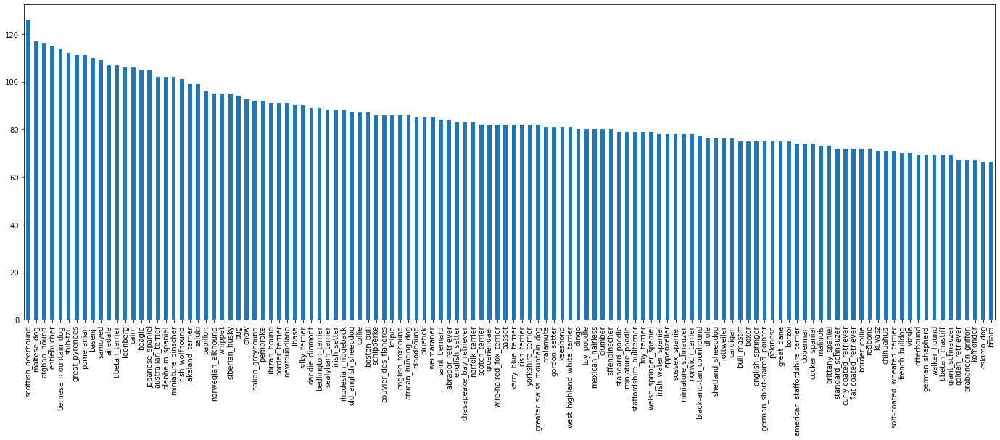

In [6]:

labels_csv['breed'].value_counts().plot.bar(figsize=(24,8));

In [7]:
labels_csv['breed'].value_counts().median()

82.0

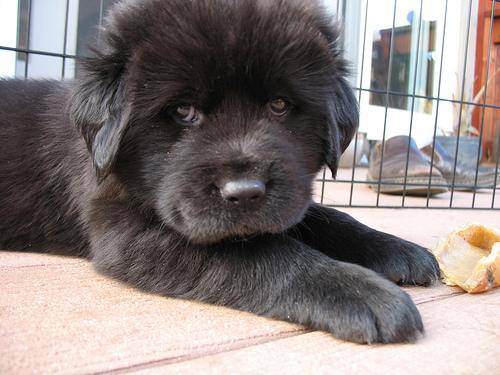

In [8]:
# Let's view an image
from IPython.display import Image
Image('drive/MyDrive/Datasets/Dog Detection Data/train/fb211e01f77eedac02e92d6bfeedb3ab.jpg')

#### Getting images and their labels
* Get images file pathnames# 

In [9]:
# Create pathnames from image ID's

filenames = ['drive/MyDrive/Datasets/Dog Detection Data/train/' + fname + '.jpg' for fname in labels_csv['id'] ]
filenames[:10]

['drive/MyDrive/Datasets/Dog Detection Data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Datasets/Dog Detection Data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Datasets/Dog Detection Data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Datasets/Dog Detection Data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Datasets/Dog Detection Data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Datasets/Dog Detection Data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Datasets/Dog Detection Data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Datasets/Dog Detection Data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Datasets/Dog Detection Data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Datasets/Dog Detection Data/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
# Check whether number of filename matches number of actual image files
import os
if len(os.listdir('drive/MyDrive/Datasets/Dog Detection Data/train/')) == len(filenames):
  print('Files and names matches')
else:
  print('Review something is wrong')


Files and names matches


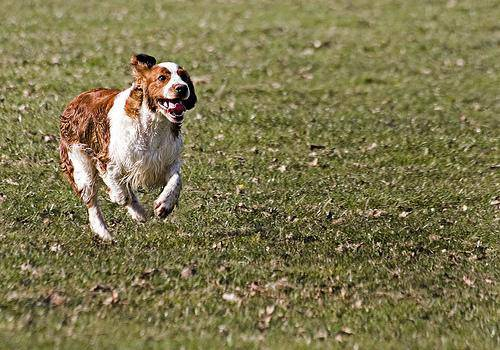

In [11]:
# One more check
Image(filenames[83])

In [12]:
labels_csv['breed'][82]

'malamute'

In [13]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
# Number labels == filenames
len(labels) == len(filenames)

True

In [15]:
# Find unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [16]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
len(boolean_labels)

10222

In [17]:
boolean_labels[0].astype(int)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

### Create the validation set

In [18]:
# Setup X & Y variables
X = filenames
Y = boolean_labels

#### Reduce around of 1000 images to start off experimenting

In [19]:
# Set number of images to use 
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [20]:
# Split into train and validation
from sklearn.model_selection import train_test_split

# Training and valiadtion of total size NUM_IMAGES
X_train, X_val, Y_train, Y_val = train_test_split(X[:NUM_IMAGES], Y[:NUM_IMAGES], test_size=0.2, random_state=82)

In [21]:
len(X_train), len(Y_train)

(800, 800)

In [22]:
# Check if training data
X_train[:1], Y_train[:1]

(['drive/MyDrive/Datasets/Dog Detection Data/train/0097c6242c6f3071762d9f85c3ef1b2f.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, F

### Preprocessing Images (Turning Images into Tensors)
1. Take an image filepath as imput
2. Use Tensor to read the file and save it to a variable, 'image'
3. Turn our 'image (a jpg) into Tensors
4. Normalize image (convert from 0-255 to 0-1)
5. Resize the 'image' to be a shape of (224, 224)
6. Return the modify 'images'

In [23]:
# Convert an image into numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [24]:
image.max(), image.min()

(255, 0)

In [25]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [26]:
# Define image size
IMG_SIZE = 224

# Function to preprocess an Image
def process_image(image_path):
  # Read image file
  image = tf.io.read_file(image_path)

  # Turn image into numerical tensor with 3 colour channels(RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  # Conver the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image 


In [27]:
tensor = tf.io.read_file(filenames[26])
tensor.shape

TensorShape([])

In [28]:
tensor = tf.image.decode_jpeg(tensor, channels=3)

In [29]:
tf.image.convert_image_dtype(tensor, tf.float32)[:1]

<tf.Tensor: shape=(1, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]]], dtype=float32)>

### Turning our data into batches

Because all image might not fit into memory.

Tensor need tensor tuples: (image, label)

In [30]:
# Create a function to return a tuple of tensors (image, label)

def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [31]:
(process_image(X[82]), Y[82])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.00031513, 0.        ],
         ...,
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ]],
 
        [[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.00031513, 0.        ],
         ...,
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ]],
 
        [[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.00031513, 0.        ],
         ...,
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ]],
 
        ...,
 
        [[0.        , 0.        

#### Turn all of the data (X & Y) into batches

In [32]:
# Define batch size, 32 is good a start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, Y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):

  # Test data probably don't have labels
  if test_data:
    print('Create test data batches:')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # Valid test don't need to shuffle
  elif valid_data:
    print('Creating valid data batches:')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(Y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # Training test needs to be shuffle
  else:
    print('Creating training data batches:')
    # Turn fipaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(Y)))

    # Shuffling
    data = data.shuffle(buffer_size=len(X))

    # Create (image,label) tuples and turn image path into prepocessed image
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
  return data_batch

In [33]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, Y_train)
val_data = create_data_batches(X_val, Y_val, valid_data=True)

Creating training data batches:
Creating valid data batches:


In [34]:
# Check out different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

#### Visualizing Data Batches

In [35]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  # Setup the figure
  plt.figure(figsize=(14,10))
  # Loop through 25 
  for i in range(25):
    # Create subplots (5,5)
    ax = plt.subplot(5,5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')

In [36]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [37]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

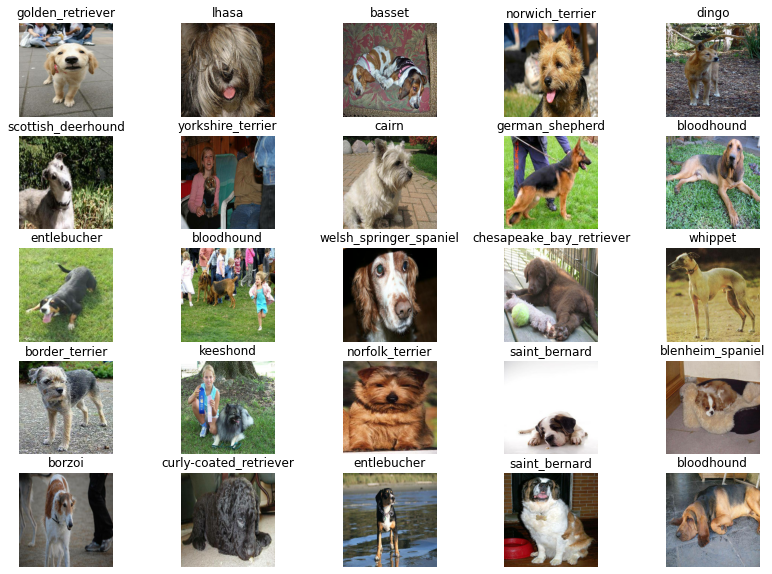

In [38]:
# Visualize data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

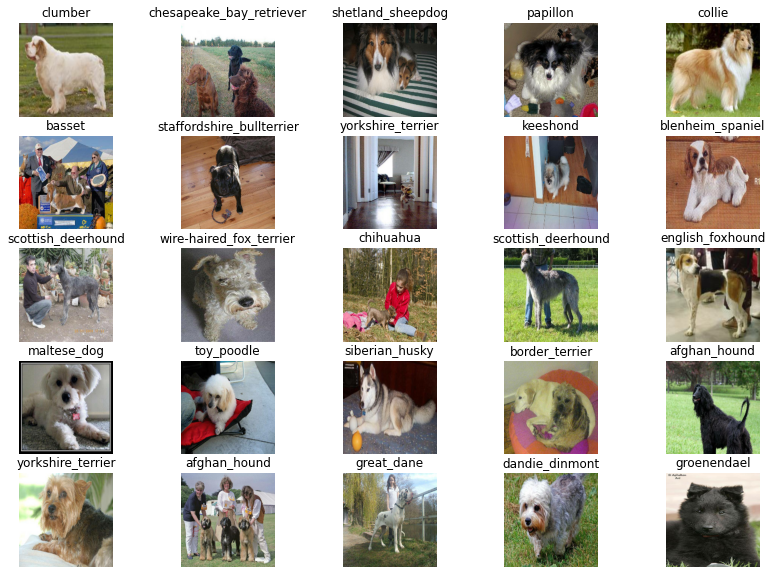

In [39]:
# Visualize validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

### Building a model
Things must be define:
* The input shape(our images shape, in the form of Tensors) to our model.
* The output shape(image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow HUB.


In [40]:
# Setup input shape of the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE,3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5'

Keras deep learnin gmodel = inputs, outputs and model.

Function which:
* Take s the input shape, output shaoe and the model.
* Define layers in a Keras model in sequential fashion.
* Compiles the model (evaluation and improved).
* Build the model(tells the model shape input).
* Return the model.  

In [41]:
# Create the function Keras Model:

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Model with:', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([hub.KerasLayer(MODEL_URL), tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation='softmax')])

  # Compile the model
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), optimizer=tf.keras.optimizers.Adam(), metrics=['accuracy'])

  # Build the model
  model.build(INPUT_SHAPE)

  return model 


In [42]:
model = create_model()
model.summary()

Model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5508713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,628,953
Trainable params: 120,240
Non-trainable params: 5,508,713
_________________________________________________________________


### Creating callbacks (Helper functions a model can use druing training:
* Save it progress.
* Check its progress. 
* Stop trainig early if the model stops improving.

2 Callbacks:
- For TensorBoard .- for track model progress.
- For early stopping wich prevents model from trainig for too long.

#### TensorBoard CallBack
Setup TensorBoard callback:
1. Load TensorBoadr notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to the model's fit function.
3. Visualize our model training logs with %tensorboard magic function (after model training). 

In [43]:
# Load TensorBoard notebook extension
%load_ext tensorboard


In [44]:
from numpy.ma.core import log
import datetime

# Create a function to build a TensorBoard callback
def create_tb_callback():
  # Create a log directory for storing TensorBoard logs:
  logdir = os.path.join('drive/MyDrive/Dog Detection Data/logs', datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))

  return tf.keras.callbacks.TensorBoard(logdir)

#### Early Stopping Callback

Helps stop the model from overfitting by stopping trainig if certain evalution metric stops improving.

In [45]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)

#### Training model(on subset of data)

Only with 1000 images to make sure everything is working.

In [46]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [47]:
# Check to make sure GPU is working
print('GPU', 'available' if tf.config.list_physical_devices('GPU') else 'not available')

GPU available


Function which trains a model
* Create a model useing creata a model.
* Setup TensorBoard callback using create_tb.callback()
* Call the fit function in our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks
* Return model


In [48]:
# Build a function to train and return a trained model:

def train_model():
  # Create a model
  model = create_model()

  # Create a TB session everytime we train a model
  tensorboard = create_tb_callback()

  # Fit the model to the data passing it the callbacks
  model.fit(x=train_data, epochs=NUM_EPOCHS, validation_data=val_data, validation_freq=1, callbacks=[tensorboard, early_stopping])

  # Return the fitted 
  return model

In [49]:
# Fit the model to the data
model = train_model()

Model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5
Epoch 1/100
25/25 [==============================] - 155s 5s/step - loss: 4.6879 - accuracy: 0.1063 - val_loss: 3.7065 - val_accuracy: 0.2100
Epoch 2/100
25/25 [==============================] - 3s 123ms/step - loss: 1.8334 - accuracy: 0.6687 - val_loss: 2.4070 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 3s 126ms/step - loss: 0.6578 - accuracy: 0.9187 - val_loss: 1.9078 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 3s 123ms/step - loss: 0.2754 - accuracy: 0.9862 - val_loss: 1.7076 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 3s 124ms/step - loss: 0.1546 - accuracy: 1.0000 - val_loss: 1.6266 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 4s 154ms/step - loss: 0.1025 - accuracy: 1.0000 - val_loss: 1.5833 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================] - 

Apparently model is overfitting because it's performing way better on the training dataset than the validation dataset.

In [50]:
### Checking the TB logs.- TB magic function(%tensorboard) will access logs directory and visualize its content
%tensorboard --logdir drive/MyDrive/Dog\ Detection\ Data/logs

Output hidden; open in https://colab.research.google.com to view.

### Making and evaluating prediction using a trained model

In [51]:
# Make prediction on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 3s 95ms/step


array([[5.0519017e-04, 1.0125637e-03, 1.8699867e-04, ..., 7.4895717e-05,
        2.1448766e-04, 1.2181971e-04],
       [9.8767341e-04, 6.2932731e-03, 5.3667312e-04, ..., 6.2410202e-04,
        2.8685923e-04, 2.2229765e-04],
       [1.4371898e-04, 1.3085400e-03, 3.2458566e-03, ..., 9.0052978e-05,
        2.0042267e-03, 3.6650346e-04],
       ...,
       [7.1353398e-02, 1.5015061e-03, 2.1606684e-04, ..., 1.6631557e-04,
        2.4295454e-04, 1.4383972e-03],
       [1.4129526e-04, 4.9274699e-03, 4.8614093e-04, ..., 7.7505494e-05,
        4.0141273e-05, 9.8946900e-04],
       [1.4581096e-03, 6.1739040e-05, 1.7377301e-04, ..., 1.3148629e-04,
        4.2492007e-03, 3.9971814e-01]], dtype=float32)

In [52]:
predictions[199]

array([1.45810959e-03, 6.17390397e-05, 1.73773005e-04, 2.98799860e-04,
       8.42010416e-03, 1.98462541e-04, 1.42460167e-01, 9.80184041e-03,
       3.66754721e-05, 1.46523264e-04, 4.93404281e-04, 1.67796342e-03,
       6.91482332e-04, 1.73408631e-03, 2.80681124e-04, 3.47742607e-04,
       8.29818018e-04, 1.06730750e-02, 4.46855802e-06, 5.18013898e-04,
       1.45350152e-03, 5.25489217e-04, 1.99517992e-04, 4.67482321e-02,
       2.33735889e-03, 7.87898316e-04, 6.34490838e-03, 4.09589920e-05,
       2.32492061e-03, 1.27501122e-03, 1.24465756e-03, 1.48970273e-03,
       6.57199853e-05, 2.07102322e-03, 1.75479072e-04, 4.70612431e-03,
       4.42251876e-05, 2.52713449e-04, 1.21067686e-04, 1.76887988e-05,
       6.54545220e-05, 1.54133268e-05, 4.91207757e-04, 3.64840962e-04,
       1.13327790e-03, 4.74930766e-06, 6.22485764e-04, 1.67214940e-03,
       1.13559538e-03, 7.97602814e-04, 2.71330180e-04, 9.92779951e-06,
       1.76266287e-04, 9.19663362e-05, 1.40367600e-04, 6.41628139e-05,
      

In [53]:
# First prediction
index = 0
print(predictions[index])
print(f'Max value (probability of predictions): {np.max(predictions[index])}')
print(f'Sum: : {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predict label: {unique_breeds[np.argmax(predictions[index])]}')

[5.05190168e-04 1.01256371e-03 1.86998674e-04 1.79034847e-04
 1.56877941e-04 1.18009120e-04 2.96279213e-05 3.30257230e-04
 4.34309361e-04 3.78035445e-04 4.55147121e-04 2.27455306e-03
 1.50682696e-04 5.78169199e-03 3.65967484e-04 2.18762830e-03
 2.41175425e-04 1.35829483e-04 2.55571504e-04 2.07724675e-04
 3.28754715e-04 2.07672769e-04 2.52339523e-04 7.99347181e-04
 4.92149917e-03 4.67103353e-04 4.81979776e-04 1.04381113e-04
 2.04579113e-03 9.76400552e-05 1.17198401e-03 9.14862037e-01
 5.23954746e-04 3.89417437e-05 5.20949077e-04 3.12745397e-04
 4.42866076e-05 1.55828791e-04 1.35827158e-03 9.32795228e-04
 7.63723208e-03 5.74210368e-04 3.58502468e-04 8.15178500e-05
 1.89411818e-04 1.12183414e-04 3.12348799e-04 2.75863276e-05
 2.27246725e-04 1.29031227e-03 8.17388645e-04 3.91127891e-04
 5.44405077e-04 3.57739307e-04 7.67836973e-05 1.63444449e-04
 1.95251626e-03 2.26572854e-04 1.65885052e-04 9.50906760e-05
 1.79760958e-04 9.44883097e-04 1.68559884e-04 2.34933919e-04
 1.48376077e-03 7.758507

In [54]:
np.argmax(predictions[1])

28

Predictions probabilities are also known as confidence levels

In [55]:
# Turn predictions probabilities into their respective labels (easier to understand)
def get_pred_label(pred_prob):
  return unique_breeds[np.argmax(pred_prob)]


In [56]:
pred_label  = get_pred_label(predictions[82])
pred_label

'groenendael'

In [57]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [58]:
def unbatchify(data):
# Unbatch validation set to compare prediction to validation labels (true labels).
  images_ = []
  labels_ = []

# Loop through unbatch data
  for image, label in val_data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])

  return images_, labels_

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.34509805, 0.30588236, 0.27058825],
         [0.31218487, 0.27955183, 0.23767509],
         [0.29152662, 0.26589638, 0.20840338],
         ...,
         [0.2648459 , 0.29621845, 0.21386553],
         [0.2724789 , 0.30385146, 0.22149852],
         [0.28235295, 0.3137255 , 0.23137257]],
 
        [[0.34338236, 0.30416667, 0.26887256],
         [0.31046918, 0.27783614, 0.2359594 ],
         [0.2923232 , 0.26669294, 0.20919995],
         ...,
         [0.26267067, 0.2940432 , 0.20825893],
         [0.2687718 , 0.30014434, 0.21436004],
         [0.27720588, 0.30857843, 0.22279413]],
 
        [[0.3409314 , 0.3017157 , 0.2661765 ],
         [0.3080182 , 0.27538517, 0.23305762],
         [0.29310226, 0.26765144, 0.20948881],
         ...,
         [0.25882792, 0.29044557, 0.19877888],
         [0.26274067, 0.2943583 , 0.20269164],
         [0.26911765, 0.3007353 , 0.20906864]],
 
        ...,
 
        [[0.48357847, 0.42058825, 0.35686275],
         [0.46341914, 0.40042895, 0.33670

In [59]:
get_pred_label(val_labels[0])

'affenpinscher'

In [60]:
get_pred_label(predictions[0])

'clumber'

To make it more visual we neeed:

* Predictions labels
* Validation labels (truth labels)
* Validation images

In [61]:
def plot_pred (pred_prob, labels, images, n=1):
  pred_prob, true_label, image = pred_prob[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob=pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the depending prediction
  if pred_label == true_label:
    color = 'green'
  
  else:
    color = 'red'

  # Title
  plt.title(f'{pred_label} {np.max(pred_prob)*100:2.0f}% {true_label}', color = color)


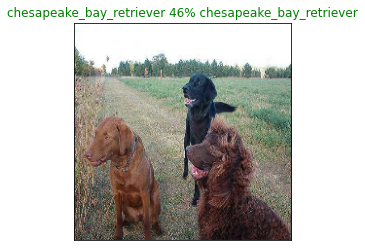

In [62]:
plot_pred(predictions, val_labels, val_images, n=1)

Function to visualize model's top ten predictions

* Take input of predictions probabilities array and a ground truth array and an integer
* Find the predictions.

Find the top 10:
* Predictions probabilities indexes
* Prediction probabilities values
* Prediction labels

In [63]:
def plot_pred_conf(pred_prob, labels, n=1):
  
  # Predicted label
  pred_prob, true_label = pred_prob[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)
  
  # Find top 10 prediction indexes
  top_10_indexes = pred_prob.argsort()[-10:][::-1]
  
  # Find top 10 prediction values
  top_10_values = pred_prob[top_10_indexes]

  # Find top 10 prediction labels
  top_10_labels = unique_breeds[top_10_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_labels)), top_10_values, color='grey')
  plt.xticks(np.arange(len(top_10_labels)), labels=top_10_labels, rotation='vertical')

  # Cahnge color of true
  if np.isin(true_label, top_10_labels):
    top_plot[np.argmax(top_10_labels == true_label)].set_color('green')

  else:
    pass

In [64]:
top_10_labels = unique_breeds[predictions[0].argsort()[-10:][::-1]]

In [65]:
np.argmax(top_10_labels == val_labels[0])

0

In [66]:
val_labels[0]

'clumber'

In [67]:
(top_10_labels == val_labels[0])

array([ True, False, False, False, False, False, False, False, False,
       False])

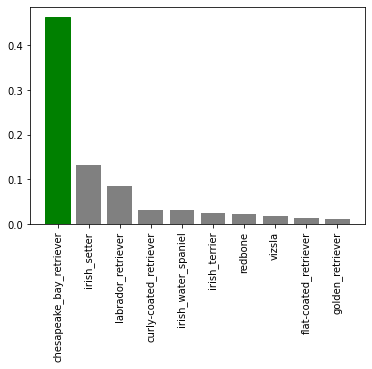

In [68]:
plot_pred_conf(predictions, val_labels, n=1)

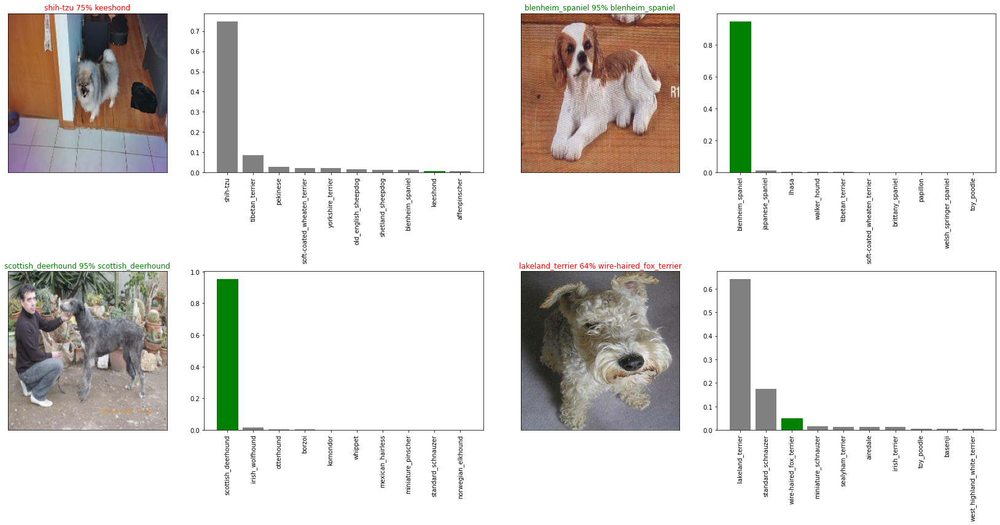

In [69]:
i_multiplier = 8
num_rows = 2
num_cols = 2

num_images = num_rows * num_cols

plt.figure(figsize=(12*num_cols, 6*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions, val_labels, val_images, n=i+i_multiplier)

  plt.subplot(num_rows, 2*num_cols, 2*i+2 )
  plot_pred_conf(predictions, val_labels, n=i+i_multiplier)

  plt.tight_layout(h_pad=1)

plt.show()

### Saving and reloading Model

In [70]:
# Create a function to save a model

def save_model(model, suffix=None):
  # Create a model directory pathname with currente time
  model_dir = os.path.join('drive/MyDrive/Dog Detection Data/models', datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))

  model_path = model_dir + '-' + suffix + '.h5' # save format model

  print(f'Saving model to: {model_path}...')

  model.save(model_path)

  return model_path


In [71]:
# Create a function to load a trained model
def load_model(model_path):
  print(f'Loading from: {model_path}')

  model = tf.keras.models.load_model(model_path, custom_objects={'KerasLayer':hub.KerasLayer})

  return model


In [72]:
# Save model
save_model(model, suffix='1000-images-mobilenetv3-Adam')

Saving model to: drive/MyDrive/Dog Detection Data/models/20220813-21421660426925-1000-images-mobilenetv3-Adam.h5...


'drive/MyDrive/Dog Detection Data/models/20220813-21421660426925-1000-images-mobilenetv3-Adam.h5'

In [73]:
# Load a trained model
loaded_model = load_model('drive/MyDrive/Datasets/Dog Detection Data/models/20220531-21561654034178-1000-images-mobilenetv3-Adam.h5')

Loading from: drive/MyDrive/Datasets/Dog Detection Data/models/20220531-21561654034178-1000-images-mobilenetv3-Adam.h5


In [74]:
loaded_model.evaluate(val_data)

7/7 [==============================] - 1s 78ms/step - loss: 1.3769 - accuracy: 0.6150


[1.3769413232803345, 0.6150000095367432]

In [75]:
model.evaluate(val_data)

7/7 [==============================] - 1s 81ms/step - loss: 1.4928 - accuracy: 0.6450


[1.492828369140625, 0.6449999809265137]

### Training a big model on the full data

In [76]:
len(X), len(Y)

(10222, 10222)

In [77]:
# Create a data batch with full data set

full_data = create_data_batches(X, Y)

Creating training data batches:


In [78]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [79]:
# Create a model for full model
full_model = create_model()

Model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5


In [80]:
# Create full model callbacks
full_model_tb = create_tb_callback()

# No validation set when training on al the data, so we can't monitor validation accuracy
full_model_early = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tb, full_model_early])

Epoch 1/100
320/320 [==============================] - 42s 118ms/step - loss: 1.3453 - accuracy: 0.6754
Epoch 2/100
320/320 [==============================] - 36s 111ms/step - loss: 0.3943 - accuracy: 0.8840
Epoch 3/100
320/320 [==============================] - 37s 116ms/step - loss: 0.2227 - accuracy: 0.9404
Epoch 4/100
320/320 [==============================] - 38s 119ms/step - loss: 0.1413 - accuracy: 0.9684
Epoch 5/100
320/320 [==============================] - 39s 123ms/step - loss: 0.0953 - accuracy: 0.9832
Epoch 6/100
320/320 [==============================] - 38s 118ms/step - loss: 0.0692 - accuracy: 0.9903
Epoch 7/100
320/320 [==============================] - 38s 119ms/step - loss: 0.0509 - accuracy: 0.9950
Epoch 8/100
320/320 [==============================] - 38s 119ms/step - loss: 0.0390 - accuracy: 0.9976
Epoch 9/100
320/320 [==============================] - 39s 123ms/step - loss: 0.0327 - accuracy: 0.9975
Epoch 10/100
320/320 [==============================] - 37s 115m

In [ ]:
save_model(full_model, suffix='full-set-mobilenetv3-Adam')

Saving model to: drive/MyDrive/Dog Detection Data/models/20220813-21581660427914-full-set-mobilenetv3-Adam.h5...


'drive/MyDrive/Dog Detection Data/models/20220813-21581660427914-full-set-mobilenetv3-Adam.h5'

In [ ]:
full_model_l = load_model('drive/MyDrive/Datasets/Dog Detection Data/models/20220601-01301654047043-full-set-mobilenetv3-Adam.h5')

Loading from: drive/MyDrive/Datasets/Dog Detection Data/models/20220601-01301654047043-full-set-mobilenetv3-Adam.h5


### Making predictions on the test dataset 

* Test data have to be converted into the same format.

1. Get the teste image filenames.
2. Convert file name into test data batches using 'create_data_batches' and setting 'test data' parameter to true (test data doesn't have parameters).
3. Make a predictions array passing the teste batches to the predict() method (our model). 

In [ ]:
 # Load test image filenames
 test_path = 'drive/MyDrive/Datasets/Dog Detection Data/test/'
 test_filenames = [test_path + fname for fname in os.listdir(test_path)]
 test_filenames[:10]

['drive/MyDrive/Datasets/Dog Detection Data/test/e4d878f113883a3caab47d3126d2c2a4.jpg',
 'drive/MyDrive/Datasets/Dog Detection Data/test/e46f65254fdf01d5fe732068c844efbd.jpg',
 'drive/MyDrive/Datasets/Dog Detection Data/test/dff6d0e5746812e0e5808c0e69a20574.jpg',
 'drive/MyDrive/Datasets/Dog Detection Data/test/e7fcdf9671a6593b638cbee42842f981.jpg',
 'drive/MyDrive/Datasets/Dog Detection Data/test/e5ded7a736b3336729463af8d74a09c9.jpg',
 'drive/MyDrive/Datasets/Dog Detection Data/test/e1e79b3edfb3579e46ad914bf755dbbc.jpg',
 'drive/MyDrive/Datasets/Dog Detection Data/test/e64b15ca154304104fe95ded7338858e.jpg',
 'drive/MyDrive/Datasets/Dog Detection Data/test/de6cc38e54a460dd34c53b74f022a8da.jpg',
 'drive/MyDrive/Datasets/Dog Detection Data/test/e76a58909e6e1196bdefb3105060bcbe.jpg',
 'drive/MyDrive/Datasets/Dog Detection Data/test/e699b20911a55abda3558c5bcd37443d.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Create test data batches:


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch using load model
test_predictions = full_model_l.predict(test_data, verbose=1)

324/324 [==============================] - 202s 582ms/step


In [ ]:
np.savetxt('drive/MyDrive/Datasets/Dog Detection Data/preds_array.csv', test_predictions ,delimiter=',')

In [ ]:
test_predictions = np.loadtxt('drive/MyDrive/Datasets/Dog Detection Data/preds_array.csv', delimiter=',')

In [ ]:
len(test_predictions)

10357

In [ ]:
test_predictions[1]

array([3.97720035e-09, 8.43876879e-09, 1.40535672e-09, 4.99875652e-09,
       8.06619571e-09, 7.67540920e-10, 2.40994069e-08, 3.84834316e-08,
       1.02988174e-07, 8.40972689e-07, 1.42582328e-08, 6.68382105e-09,
       8.72249287e-11, 4.15552215e-08, 1.08528857e-08, 1.81931043e-07,
       3.70921693e-09, 2.42106609e-07, 1.61383532e-10, 9.44006047e-08,
       5.39268328e-08, 3.54711619e-06, 1.12276564e-06, 1.36044109e-09,
       1.48831658e-08, 1.08823262e-03, 1.64097401e-07, 6.43755893e-09,
       6.67302302e-08, 3.55927767e-08, 4.88888759e-07, 1.72162054e-08,
       1.57186175e-08, 9.52507517e-10, 5.94608540e-09, 8.23771718e-10,
       2.23211269e-10, 3.79750231e-10, 2.56966060e-10, 3.40455419e-09,
       3.06473886e-08, 3.21756866e-09, 8.91224960e-09, 1.72648307e-09,
       5.33020206e-08, 3.06710467e-06, 2.94087983e-11, 8.73590906e-08,
       2.06856257e-08, 7.96894071e-08, 7.55202914e-11, 8.03841615e-08,
       2.04669490e-08, 1.17610748e-08, 2.70952660e-09, 6.25994465e-11,
      

## Preparing test dataset predictions for Kaggle

DataFrame with an ID and a column for each different dog breed.

1. Create pandas DF with an ID columns as well as a colum for each dog breed.
2. Add data to the ID column by extracting the test image ID's from their filepaths.
3. Add data (the predcition probabilities) to each of the dog breed columns.
4. Export the DF as a CSV to submit it to Kaggle.


In [ ]:
# Create panadas DF with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))


In [ ]:
# Append test image ID's to predictions DF
test_id = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_id[:2]

In [ ]:
os.path.splitext(test_filenames[0])

In [ ]:
preds_df['id'] = test_id

In [ ]:
preds_df.head(2)

In [ ]:
preds_df.shape

In [ ]:
# Add the prection probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head(2)

In [ ]:
preds_df.to_csv('drive/MyDrive/Datasets/Dog Detection Data/full_model_predictions.csv', index=False)

# Making predictions on custom images

* Get filepaths of our own images
* Turn the fipath into data batches using 'create_data_batches'. Custom won't have levels so test_data must be turnt into True.
* Pas custom image databatch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.  

In [ ]:
# Get custom images filepaths
custom_path = 'drive/MyDrive/Datasets/Dog Detection Data/mydogs/'
custom_image_path = [custom_path + fname  for fname in os.listdir(custom_path)]
custom_image_path 

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_path, test_data=True)
custom_data

In [ ]:
# Make predictions on the custom data
custom_preds = full_model_l.predict(custom_data)
custom_preds.shape

In [ ]:
# Get cutom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

In [ ]:
# Get 
custom_images = []

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,5))
for i, image in enumerate(custom_images):
  plt.subplot(2, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)